In [1]:
import jax.numpy as jnp

import matplotlib.pyplot as plt
import matplotlib.animation as animation

from IPython.display import HTML

# Setup Grid

- The simulation will be processed in a Sx by Sy grid.

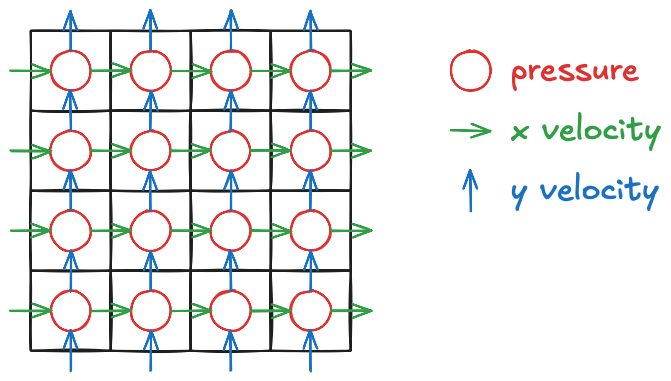

In [2]:
# Simulation domain size.
Sx, Sy = 64, 64
# Cell size.
dx = 1/4
# Wave speed.
c = 10
# Simulate time.
time_span = 8
# Delta time.
dt = dx / (c * pow(2, 0.5))
frames = int(time_span / dt)

dt

0.017677669529663688

In [3]:
# Init grid.
def init_grid():
    p = jnp.zeros((Sx, Sy))
    vx = jnp.zeros((Sx + 1, Sy))
    vy = jnp.zeros((Sx, Sy + 1))
    return (p, vx, vy)

p, vx, vy = init_grid()
p.shape, vx.shape, vy.shape

((64, 64), (65, 64), (64, 65))

# FDTD

1. Update cell velocity with pressure gradient.
2. Set velocity source.
3. Update pressure with velocity divergence.

## Velocity Source

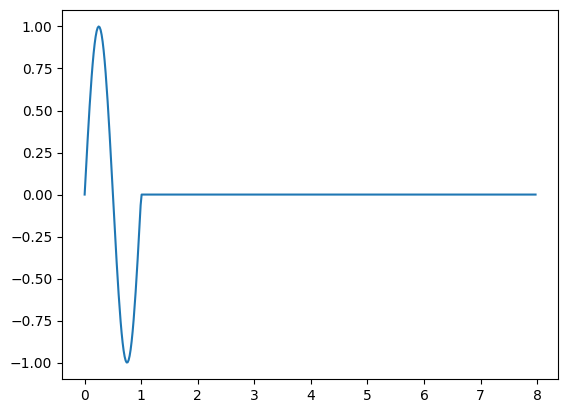

In [4]:
# Pressure function.
def p_func(t):
    return jnp.sin(2 * jnp.pi * t) * (t < 1)

# Plot pressure curve from t = 0 to 2.
fig, ax = plt.subplots()
txs = jnp.linspace(0, (frames - 1)*dt, frames)
ax.plot(txs, p_func(txs))

In [5]:
# Audio pressure mask and source.
p_mask = jnp.zeros((frames, Sx, Sy)).astype(bool)
p_source = jnp.zeros((frames, Sx, Sy))
# Add source.
p_mask = p_mask.at[:, 15:17, 15:17].set(True)
p_source = p_source.at[:, 15:17, 15:17].set(p_func(txs)[:, jnp.newaxis, jnp.newaxis])
# Add wall.
p_mask = p_mask.at[:, 31:33, 15:32].set(True)

In [6]:
fig, (ax_mask, ax_source) = plt.subplots(ncols=2)

artists = []
for frame in range(frames):
    img_mask = ax_mask.imshow(p_mask[frame].T)
    ax_mask.invert_yaxis()
    img_source = ax_source.imshow(p_source[frame].T, vmin=-1, vmax=1)
    ax_source.invert_yaxis()
    artists.append([img_mask, img_source])

anim = animation.ArtistAnimation(fig=fig, artists=artists, interval=int(dt*1000))
plt.close()
HTML(anim.to_jshtml())

In [7]:
# Update source pressure.
def set_source_pressure(p: jnp.ndarray, frame: int):
    return p.at[p_mask[frame]].set(p_source[frame, p_mask[frame]])

## Velocity

In [8]:
# Update velocity using pressure gradient.
def update_velocity(p: jnp.ndarray, vx: jnp.ndarray, vy: jnp.ndarray):
    vx = vx.at[1:-1, :].add(-(p[1:, :] - p[:-1, :]) / dx * dt)
    vy = vy.at[:, 1:-1].add(-(p[:, 1:] - p[:, :-1]) / dx * dt)
    return vx, vy

## Pressure

In [9]:
def update_pressure(p: jnp.ndarray, vx: jnp.ndarray, vy: jnp.ndarray):
    div_x = vx[1:, :] - vx[:-1, :]
    div_y = vy[:, 1:] - vy[:, :-1]
    div = div_x + div_y
    p = p - c**2 * div * dt
    return p

## Main Loop

In [10]:
def fdtd(grid, t, dt, frame):
    p, vx, vy = grid
    # Set source pressure.
    p = set_source_pressure(p, frame)
    # Update velocity.
    vx, vy = update_velocity(p, vx, vy)
    # Update pressure.
    p = update_pressure(p, vx, vy)
    p = set_source_pressure(p, frame)
    return (p, vx, vy)

In [11]:
# Render settings.
fps = 60
fdt = 1 / fps

In [12]:
fig, ax = plt.subplots()

artists = []
p, vx, vy = init_grid()
t = 0
fdt_counter = fdt
for frame in range(frames):
    p, vx, vy = fdtd((p, vx, vy), t, dt, frame)
    t += dt
    img = ax.imshow(p.T, vmin=-1, vmax=1, cmap="coolwarm")
    ax.invert_yaxis()
    if fdt_counter >= fdt:
        artists.append([img])
        fdt_counter -= fdt
    fdt_counter += dt

anim = animation.ArtistAnimation(fig=fig, artists=artists, interval=int(fdt * 1000))
plt.close()
HTML(anim.to_jshtml())

In [13]:
anim.save(filename="fdtd.gif", writer="pillow")